# Product Sales Analysis

In [1]:
import pandas as pd
import requests
from io import StringIO
import plotly.express as px
from prophet import Prophet

In [2]:
# Params
promo_cutoff_window = 120

In [3]:
customer_product_sales_df = pd.read_csv('product_data.csv')

## EDA

In [4]:
customer_product_sales_df.head()

,Customer,Product,Date,Volume,NetSales
0,Customer A,40146,1/1/2020,9.0,248.4
1,Customer A,40146,2/1/2020,10.0,276.0
2,Customer A,40146,3/1/2020,6.0,165.6
3,Customer A,40146,4/1/2020,22.0,607.2
4,Customer A,40146,5/1/2020,34.0,938.4


In [5]:
customer_product_sales_df['Customer'].unique()

array(['Customer A', 'Customer B'], dtype=object)

In [6]:
customer_product_sales_df['Product'].unique()

array([40146, 41136, 41199, 41200, 43361, 51004, 52500, 53044, 53460,
       52710])

In [7]:
customer_product_sales_df['Product'] = customer_product_sales_df['Product'].astype(str) # to ensure Products are treated as individual items and not continous ranges
fig = px.scatter(customer_product_sales_df, x="Date", y="Volume", color="Product", facet_col="Customer", title="Volume by Customer and Product over time")
fig.show()

Taking an initial look at the volume data we can see that there is quite a bit of variability over time. Volume ranges from low single digits on some days to 10s of thousands on others for some products, and is fairly consistent for others. It is interesting to note however that this variability is mostly driven by just a few products, mainly 41136 (for Customer A), 41200 and 52500. For the other products, volume tends to be much more consistent.

There also does not appear to be any particular growth trend at first glance, it appears to be relatively random. However, some for some products patterns of seasonality appear to be apparent, an example for this would be product 41200 which appears to spike in volume usually during the middle of the year between May and August.

We also see a few instances of negative sales volume or net sales, which I assume to be due to faulty data. I will therefore exclude these data points from the data set. The other possibility would of course be that these are simply customers returning items, which in a real world scenario would need to be confirmed with the customer.

In [8]:
customer_product_sales_df = customer_product_sales_df[ (customer_product_sales_df['Volume'] >= 0) & (customer_product_sales_df['NetSales'] >= 0)]

In [9]:
fig = px.scatter(customer_product_sales_df, x="Date", y="NetSales", color="Product", facet_col="Customer", title="NetSales by Customer and Product over time")
fig.show()

As could be expected, NetSales and Volume appear to be quite correlated at first glance. Nothing too surprising here.

# Price EDA

In [10]:
customer_product_sales_df['Price'] = customer_product_sales_df['NetSales'] / customer_product_sales_df['Volume']  # this will be the actual price paid, so promotional if there is a promotion and baseline otherwise.
fig = px.scatter(customer_product_sales_df, x="Date", y="Price", color="Product", facet_col="Customer", title="Price by Customer and Product over time")
fig.show()

At first glance we notice that there are essentially two categories of products: 

1.) Products with relatively constant prices, such as 40146, 52500 or 41136. These some times have modest temporary price changes, which likely can be attributed to promotions.

2.) Products with extremely volatile pricing differences, even from one day to the next such as 43361, 41199 or 51004. 

Another important observation is that customers A and B are charged different prices for the same products. This also applies to periods that could be considered promotions. This rules out an initial idea I had to look at simultaneous price reductions for both customers to detect promotional periods.

### Outliers
Even after removing the negative volume/ sales, there still appear to be a few suspicious looking data points. For example product 41200 for Customer A is usually priced in the $7 - $9 range, however also has one data point at $ 42 and another one at $0.44. Knowing what kind of product this is would of course make this a lot clearer. Using some kind of outlier detection algorithm such as ECOD or an Isolation Forest could be useful in this situation. However there is of course the possibility that this simply happens to be a very volatile product, perhaps linked to some kind of natural resource so that I will leave it in for now.

### Temporary price reductions
Temporary price reductions are a good first indicator of a sale or promotion taking place. We can see in the above plot that this is the case for some products, for example 41199, while for others such as 40146 the price stays constant over the entire period.

### Temporary volume spikes
Temporary volume spikes are another good indicator, in particular in conjunction with price reductions. By themselves, they could also simply be due to the customer's particular requirements. 

### Correlation between volume and price
To get an idea about the relationship between price reductions and changes in sales volume I will investigate the correlation between the two.

In [11]:
corrs = customer_product_sales_df.groupby(['Customer', 'Product']).apply(lambda x: x['Volume'].corr(x['Price'])).reset_index(name='Correlation').sort_values(by='Correlation')
corrs

,Customer,Product,Correlation
8,Customer A,53460,-0.653000
1,Customer A,41136,-0.632545
4,Customer A,43361,-0.380354
2,Customer A,41199,-0.367715
6,Customer A,52500,-0.336149
11,Customer B,41199,-0.274540
13,Customer B,43361,-0.264676
10,Customer B,41136,-0.245694
14,Customer B,51004,-0.205036
16,Customer B,52710,-0.147165


Overall we can see negative correlations between price and volume almost across the board for both customers and across all products (with the exception of Customer B with product 53044 which is positive but close to zero). This of course is to be expected, as basic economics suggests a lower price should increase demand.

What is interesting however is the difference in correlations across different products, and for the same products between the two customers.

### Correlation between price and volume as a measure of price sensitivity
Looking at correlations between price and sales volume is a potential way of measuring the sensitivity to pricing changes and promotions for different customers and various items. It will be a useful way towards calculating baseline volume once the difference between baseline price and the current promotional price has been established. I will therefore add it to the dataframe.

In [12]:
customer_product_sales_df = pd.merge(customer_product_sales_df, corrs, left_on=['Customer', 'Product'], right_on=['Customer', 'Product'], how='left').rename(columns = {'Correlation' : 'Price_Sensitivity'})

# Part 1: Baseline price/ volume algorithm

### Baseline price assumptions
The key problem in designing the baseline price and volume algorithm of course is determining what constitutes a promotion or sale and what is in fact the baseline price. Two factors appear logical to be used in determining this and I will be using these assumptions to build the algorithm:

1.) A promotional or sale price will always be lower than the baseline price. Therefore, if there is a price increase it either means the baseline price has increased or the previous price was a promotion and now the current price is either the baseline price, or still a promotion but one that is less discounted that previously. Either way, the baseline price will have to be at least as high as this new increased price. We have to assume here that there are no periods of temporary surcharges like for example in hospitality venues on public holidays on these products.

2.) The length of any price decrease, obviously the longer this happens the more likely it is a permanent baseline price decrease. According to a Google search there is no established industry standard as to what constitutes a promotion/ sale compared to a permanent price decrease. I would argue that in business 120 days is a sufficiently long time to constitute a permanent price change. I will therefore consider a price decrease that lasts for longer than 120 days a permanent decrease in the baseline price and no longer a sale/ promotion.

Based on these two assumptions, I will be looking at the 120 day rolling maximum price for each product for each customer and assume this to be the baseline price.

### Baseline volume assumptions
Having calculated the correlations between price and sales volumes for each customer and product we can now use this as a proxy for price sensitivity for each customer and product. Having calculated the baseline price in the previous step, we can now simply take the percentage of the discount to the baseline price multiplied by the price sensitivity to come up with a factor by which the price discount would have inflated sales volume. We can then multiply actual volume with the inverse to get to an estimate for baseline volume.

In [13]:
def calc_baseline_price_vol_ma(product_sales_df: pd.DataFrame, promo_cutoff_window: int):
    """
    This is the key function for calculating Baseline price and baseline volume, which is based on the price calculation.
    """
    # The below 1 line of code does most of the heavy lifting in determining baseline price and therefore deserves some further explanation: 
    # We group the dataframe by customer and product, as we want to determine baseline price for each of these separately. We are then interested, for each time point, what the highest price
    # to both sides of this time point is. The center = True parameter specifies that we use each time point as the center, and then look for a total of time steps specified by the window parameter
    # in both directions (but of course only up to the total steps specified in window, so if window = 60 than 30 to each side). This has the benefit that we can detect prices that started off as 
    # promotions and don't have to wait for a certain number of time steps first to detect these. Effectively, we are detecting the highest price in the vicinity of each time step when it is evaluated,
    # which according to the above assumption would be what I would consider the closest estimate to the baseline price.
    product_sales_df['Baseline_Price'] = product_sales_df.groupby(['Customer', 'Product'])['Price'].transform(lambda x: x.rolling(window=promo_cutoff_window, min_periods=1, center=True).max())
    
    # Price_diff_pct is the percentage difference between our estimated baseline price and the actual price, in other words the percentage discount the customer received.
    product_sales_df['price_diff_pct'] = (product_sales_df['Price'] - product_sales_df['Baseline_Price']) / product_sales_df['Baseline_Price']
    
    # Baseline Volume is then calculated using the inverse of percentage discount in price multiplied with price sensitivity multiplied by actual volume.
    product_sales_df['Baseline_Volume'] = product_sales_df['Volume'] * (1 - product_sales_df['price_diff_pct'] * product_sales_df['Price_Sensitivity'])
    
    return product_sales_df

In [14]:
# Note: promo_cutoff_window is defined at the top in the params section. This is the variable for the 180 day assumption permanent price decrease assumption mentioned above

product_sales_df_baseline = calc_baseline_price_vol_ma(product_sales_df = customer_product_sales_df, promo_cutoff_window=promo_cutoff_window)

In [15]:
product_sales_df_baseline

,Customer,Product,Date,Volume,NetSales,Price,Price_Sensitivity,Baseline_Price,price_diff_pct,Baseline_Volume
0,Customer A,40146,1/1/2020,9.0,248.40,27.60,-0.045295,27.60,0.000000e+00,9.0
1,Customer A,40146,2/1/2020,10.0,276.00,27.60,-0.045295,27.60,0.000000e+00,10.0
2,Customer A,40146,3/1/2020,6.0,165.60,27.60,-0.045295,27.60,-1.287215e-16,6.0
3,Customer A,40146,4/1/2020,22.0,607.20,27.60,-0.045295,27.60,0.000000e+00,22.0
4,Customer A,40146,5/1/2020,34.0,938.40,27.60,-0.045295,27.60,-1.287215e-16,34.0
...,...,...,...,...,...,...,...,...,...,...
16201,Customer B,53044,26/6/2023,123.0,870.84,7.08,0.022742,7.08,0.000000e+00,123.0
16202,Customer B,53044,27/6/2023,92.0,651.36,7.08,0.022742,7.08,0.000000e+00,92.0
16203,Customer B,53044,28/6/2023,90.0,637.20,7.08,0.022742,7.08,0.000000e+00,90.0
16204,Customer B,53044,29/6/2023,108.0,764.64,7.08,0.022742,7.08,0.000000e+00,108.0


In [16]:
fig = px.scatter(product_sales_df_baseline, x="Date", y="Baseline_Price", color="Product", facet_col="Customer", title="Baseline Price by Customer and Product over time")
fig.show()

In [17]:
fig = px.scatter(product_sales_df_baseline, x="Date", y="Baseline_Volume", color="Product", facet_col="Customer", title="Baseline Volume by Customer and Product over time")
fig.show()

# Aggregation by week

As suggested, aggregating the sales data by week seems like a good idea to smooth out some of the still very volatile product sales and prices and get a better estimate towards what the true baseline price and volume would be.

In [18]:
# Reading in the data again
customer_product_sales_df_weekly = pd.read_csv('product_data.csv')
# to ensure Products are treated as individual items and not continous ranges
customer_product_sales_df_weekly['Product'] = customer_product_sales_df_weekly['Product'].astype(str) 
# Filtering out the erroneous negative Sales
customer_product_sales_df_weekly = customer_product_sales_df_weekly[ (customer_product_sales_df_weekly['Volume'] >= 0) & (customer_product_sales_df_weekly['NetSales'] >= 0)]

# Aggregating the daily sales data by week, this requires changing 'Date' to datetime object
customer_product_sales_df_weekly['Date'] = pd.to_datetime(customer_product_sales_df_weekly['Date'], format = "%d/%m/%Y")
customer_product_sales_df_weekly.set_index('Date', inplace=True)
customer_product_sales_df_weekly = customer_product_sales_df_weekly.groupby(['Customer', 'Product']).resample('W').agg({'Volume': 'sum', 'NetSales' : 'sum'}).reset_index()

# Calculating price based on aggregate weekly sales and volume data
customer_product_sales_df_weekly['Price'] = customer_product_sales_df_weekly['NetSales'] / customer_product_sales_df_weekly['Volume']

# Again calculating Price/ Volume correlations to get a proxy for price sensitivity. This time using the smoothed out aggregate weekly data
corrs = customer_product_sales_df_weekly.groupby(['Customer', 'Product']).apply(lambda x: x['Volume'].corr(x['Price'])).reset_index(name='Correlation').sort_values(by='Correlation')
customer_product_sales_df_weekly = pd.merge(customer_product_sales_df_weekly, corrs, left_on=['Customer', 'Product'], right_on=['Customer', 'Product'], how='left').rename(columns = {'Correlation' : 'Price_Sensitivity'})

In [19]:
fig = px.scatter(customer_product_sales_df_weekly, x="Date", y="Price", color="Product", facet_col="Customer", title="Price by Customer and Product over time weekly")
fig.show()

In [20]:
product_sales_df_baseline_weekly = calc_baseline_price_vol_ma(product_sales_df = customer_product_sales_df_weekly, promo_cutoff_window=promo_cutoff_window)

In [21]:
product_sales_df_baseline_weekly.iloc[1000:1100, :]

,Customer,Product,Date,Volume,NetSales,Price,Price_Sensitivity,Baseline_Price,price_diff_pct,Baseline_Volume
1000,Customer A,51004,2023-01-15,733.0,14220.20,19.400000,-0.138065,19.400000,0.000000e+00,733.000000
1001,Customer A,51004,2023-01-22,709.0,13754.60,19.400000,-0.138065,19.400000,0.000000e+00,709.000000
1002,Customer A,51004,2023-01-29,689.0,13366.60,19.400000,-0.138065,19.400000,0.000000e+00,689.000000
1003,Customer A,51004,2023-02-05,744.0,14433.60,19.400000,-0.138065,19.400000,0.000000e+00,744.000000
1004,Customer A,51004,2023-02-12,726.0,14084.40,19.400000,-0.138065,19.400000,-1.831296e-16,726.000000
...,...,...,...,...,...,...,...,...,...,...
1095,Customer A,52500,2022-03-27,982.0,8907.00,9.070265,-0.662228,9.441733,-3.934324e-02,956.414760
1096,Customer A,52500,2022-04-03,4046.0,33925.56,8.384963,-0.662228,9.441733,-1.119255e-01,3746.109583
1097,Customer A,52500,2022-04-10,950.0,8703.96,9.162063,-0.662228,9.441733,-2.962062e-02,931.365161
1098,Customer A,52500,2022-04-17,1432.0,13463.52,9.401899,-0.662228,9.441733,-4.218900e-03,1427.999170


In [22]:
fig = px.scatter(product_sales_df_baseline_weekly, x="Date", y="Baseline_Price", color="Product", facet_col="Customer", title="Baseline Price by Customer and Product over time weekly")
fig.show()

In [23]:
fig = px.scatter(product_sales_df_baseline_weekly, x="Date", y="Baseline_Volume", color="Product", facet_col="Customer", title="Baseline Volume by Customer and Product over time weekly")
fig.show()

# Part 2: Time Series Forecast

### Baseline Volume forecast
This will be driven mostly by customer demand. Given that the only information we have is past sales volume and pricing data it makes sense to keep the model simple. A quick visual check of baseline volume indicates that, at least for some products, we do have significant seasonality. The stationarity assumption many models have also does not appear to be met in all instances. Therefore it is important we choose a model that is flexible enough to support these requirements, while also keeping things simple as we do not have enough additional information to justify the use of any more complex models. 

The "Prophet" model developed by Facebook appears like an excellent candidate for these requirements. It is an additive model that handles seasonality and non-stationarity very well and is very easy to use. It also finds an optimal set of hyperparameters based on the data.

The model assumes that any growth and seasonality trends stay constant as experienced in the past years' data as we do not have any additional information such as industry or product specific forecasts.

11:02:23 - cmdstanpy - INFO - Chain [1] start processing
11:02:23 - cmdstanpy - INFO - Chain [1] done processing


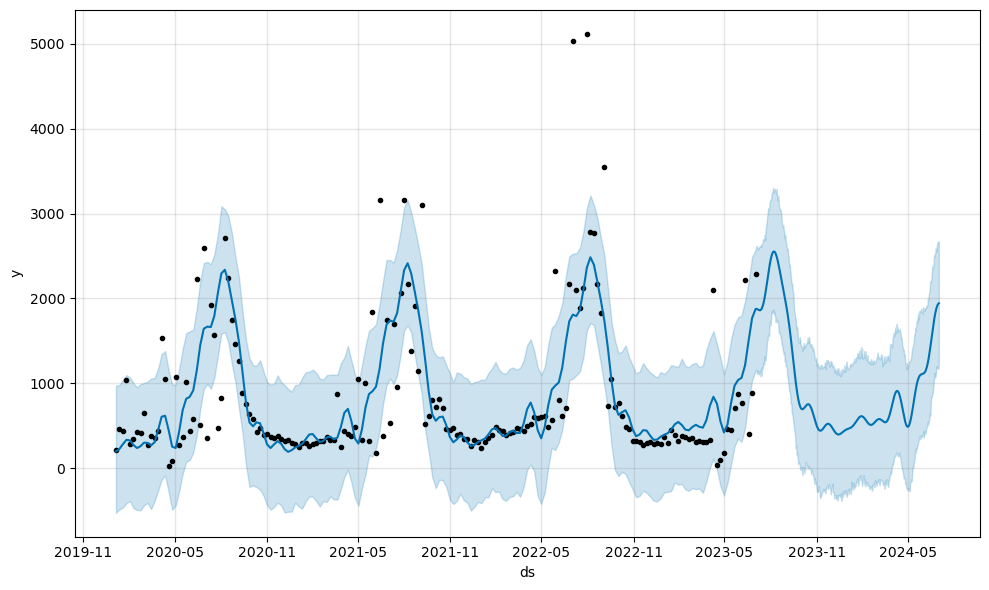

In [24]:

def create_forecast_baseline_volume(product_sales_df_baseline: pd.DataFrame, customer: str, product: str, forecast_period: int, output_graph: bool = True):
        """
        Simple wrapping function that takes as an input the product_sales_df_baseline dataframe, the customer 
        and product that we want the forecast to be made for, the amount of days out we want to create the forecast for
        and whether we want a plot to be produced showing the forecast. It returns a dataframe with the forecasted
        date and the predicted volume value (y_hat).
        """
        # Gathering the right customer and product data and renaming the columns into the right format required by prophet
        forecast_df = product_sales_df_baseline[(product_sales_df_baseline['Customer'] == customer) & (product_sales_df_baseline['Product'] == product)][['Date', 'Baseline_Volume']].rename(columns = {"Date":"ds", "Baseline_Volume":'y'})
                
        # initialising a Prophet object
        m = Prophet()
        m.fit(forecast_df)
                
        # making predictions for the specified time horizon
        future = m.make_future_dataframe(periods=forecast_period)
        forecast = m.predict(future)
        if output_graph: fig1 = m.plot(forecast)
#         return forecast[['ds', 'yhat']]
                
                
create_forecast_baseline_volume(product_sales_df_baseline_weekly, 'Customer A', '41199', 365)


11:02:24 - cmdstanpy - INFO - Chain [1] start processing
11:02:24 - cmdstanpy - INFO - Chain [1] done processing


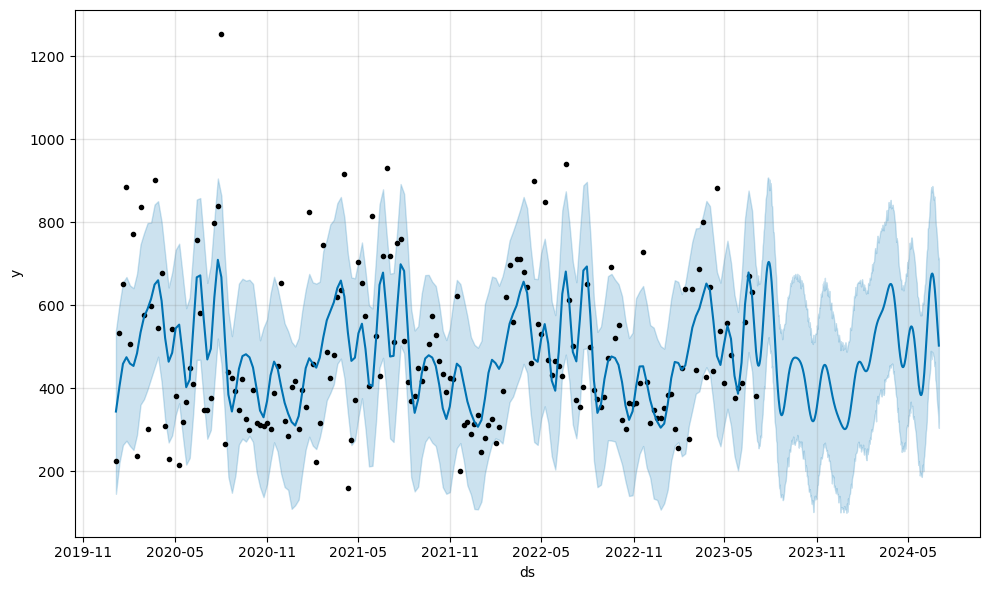

In [25]:
create_forecast_baseline_volume(product_sales_df_baseline_weekly, 'Customer B', '43361', 365)

Looking at the results visually, we can see that the Prophet model handles products with strong seasonality such as 41199 extremely well. However, products that do not exhibit strong seasonality patterns and appear to be more random such as 43361 below would probably be better modelled with a non-seasonal model, such as ARIMA, Exponential Smoothing (ETS) or a simple straight line forecast.

Of course a much better way to determine which model fits best, rather than through visual inspection alone, is by using a quantitative performance metric such as MSE, RMSE, MAE or MAPE.

The scientifically rigorous way to do this algorithmically is to simply fit all the models mentioned above, perform cross-validation to come up with the above mentioned performance metrics and use the highest scoring model to create the forecast.

The issue here is that due to our earlier weekly aggregation we have significantly reduced the number of available data points for x-validation. I will therefore re-use the daily model instead for this forecasting component.

## Cross-validated model selection forecast

In [26]:
"""
Unfortunately I am unable to complete this in the given time frame. The above would be my approach towards implementing this function. 
However, the above prophet model does a relatively good job at forecasting, especially given the limited data points that we have.
"""

from prophet.diagnostics import cross_validation, performance_metrics
from statsmodels.tsa.exponential_smoothing.ets import ETSModel

def xvalidated_forecast_baseline_volume(product_sales_df_baseline: pd.DataFrame, customer: str, product: str, forecast_period: int, output_graph: bool = True):
        """
        Function to fit Prophet, ETS, ARIMA and straight-line models to the specified customer/ product pair. The function then determines cross-validated 
        performance metrics and utilises the best scoring model to create a forecast for the specified time period.
        """
        mse_dict = {}  # dict to store MSE's for different forecast methodologies
        # Gathering the right customer and product data and renaming the columns into the right format required by prophet
        forecast_df = product_sales_df_baseline[(product_sales_df_baseline['Customer'] == customer) & (product_sales_df_baseline['Product'] == product)][['Date', 'Baseline_Volume']].rename(columns = {"Date":"ds", "Baseline_Volume":'y'})
        
        # Prophet model
#         m = Prophet()
#         m.fit(forecast_df)
#         # calculating mse on prophet model
#         df_cv = cross_validation(m, initial=f'{int(len(forecast_df) / 3)} days', period='180 days', horizon = f'{forecast_period} days')
#         df_p = performance_metrics(df_cv)
#         mse_dict['Prophet'] = df_p['mse'].mean()
        
        # ETS model

        forecast_df = pd.Series(forecast_df['y'].values, index=forecast_df['ds'])
        # Infer the frequency from the existing index
        freq = pd.infer_freq(forecast_df.index)

        # Set the frequency for the date index
        forecast_df.index.freq = freq

        # Create and fit the ETSModel
        model = ETSModel(forecast_df)
        fit = model.fit(maxiter=10000)
        print(fit.summary())
    
      
        
 
xvalidated_forecast_baseline_volume(product_sales_df_baseline, 'Customer B', '43361', 365)


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.60293D+00    |proj g|=  9.99000D-02

At iterate    1    f=  5.59692D+00    |proj g|=  5.95209D-02

At iterate    2    f=  5.59586D+00    |proj g|=  2.51088D-02

At iterate    3    f=  5.59583D+00    |proj g|=  1.47804D-02

At iterate    4    f=  5.59582D+00    |proj g|=  1.18412D-03

At iterate    5    f=  5.59582D+00    |proj g|=  7.91367D-05

At iterate    6    f=  5.59582D+00    |proj g|=  7.91367D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

/Users/lawrence/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



### Model evaluation
In a real-world scenario, at this point it would of course be important to evaluate model performance, either through a train/ test split or ideally through cross-validation to then fine-tune the model and gain an idea as to how accurate the model is and how it would perform out-of-sample. 

However, given the limited information available and due to the fact that we do not have any further subject matter knowledge on the products involved or for what purpose the forecast would be used I will skip this at this stage. Prophet does an excellent job at picking up trends and seasonality, which is really all we can hope to model with the data available.

### Baseline Price forecast
Again, since we don't have any further information on the type of products sold or the industry the firm operates in we will have to base this forecast simply on any past price movement trends. 

We can see visually, in contrast with baseline volume, that baseline prices tend to be much more "sticky" and do not exhibit any seasonality. This is almost by definition, since we constructed it to exclude any promotional price reductions that may be correlated to seasonality.

Therefore a model such as Prophet does not really make sense in this case, as it will try to find seasonality where there is none. 

Instead, I would suggest using either simply the last baseline price, due to the fact that historically baseline prices tended to stay constant for long periods of time. 

Another option would be to use the growth rate that baseline prices experienced over the length of the period we have data for and extrapolate this into the future. The key to note for this method is that the result of the forecast will be a linearly increasing straight line, while in reality the price would likely stay constant and at some point make a discrete jump rather than the gradual increase suggested by this approach. However, on average this will likely be close to where the baseline price would end up.

In [27]:
def create_forecast_baseline_price(product_sales_df_baseline: pd.DataFrame, customer: str, product: str, forecast_period: int, method: ['last_price', 'past_growth'], output_graph: bool = True):
        """
        Simple wrapping function that takes as an input the product_sales_df_baseline dataframe, the customer 
        and product that we want the forecast to be made for, the amount of days out we want to create the forecast for,
        the chosen method of creating the forecast (last_price or past_growth, as described above)
        and whether we want a plot to be produced showing the forecast. It returns a dataframe with the forecasted
        date and the predicted volume value (y_hat).
        """
        
        # Gathering the right customer and product data and renaming the columns into the right format required by prophet
        forecast_df = product_sales_df_baseline[(product_sales_df_baseline['Customer'] == customer) & (product_sales_df_baseline['Product'] == product)][['Date', 'Baseline_Price']]
        
        # Create a range of dates to extend the DataFrame
        new_dates = pd.date_range(start=forecast_df['Date'].iloc[-1] + pd.Timedelta(days=1), periods=forecast_period, freq='D')
        if method == 'last_price':
            # Create a DataFrame with the new dates and the same 'Baseline_Price'
            extension_data = {'Date': new_dates, 'Baseline_Price': forecast_df['Baseline_Price'].iloc[-1]}
            extension = pd.DataFrame(extension_data)
        elif method == 'past_growth':
            total_growth = (forecast_df['Baseline_Price'].iloc[-1] / forecast_df['Baseline_Price'].iloc[0]) - 1
            days_difference = (forecast_df['Date'].max() - forecast_df['Date'].min()).days
            average_growth_rate = (1 + total_growth) ** (1 / days_difference) - 1
            future_dates = pd.date_range(start=forecast_df['Date'].max() + pd.Timedelta(days=1), end=forecast_df['Date'].max() + pd.Timedelta(days=forecast_period), freq='D')
            future_prices = forecast_df['Baseline_Price'].iloc[-1] * (1 + average_growth_rate) ** range(1, len(future_dates) + 1)

            # Create a DataFrame with the new dates and the same 'Baseline_Price'
            extension_data = {'Date': future_dates, 'Baseline_Price': future_prices}
            extension = pd.DataFrame(extension_data)
        # Concatenate the original DataFrame and the extension DataFrame
        forecast_df = pd.concat([forecast_df, extension], ignore_index=True)
        if output_graph: 
            fig = px.scatter(forecast_df, x="Date", y="Baseline_Price", title=f"Forecasted Baseline Price for {customer} and Product {product} {forecast_period} days out")
            fig.show()
        return forecast_df
        
        
create_forecast_baseline_price(product_sales_df_baseline_weekly, 'Customer A', '52500', 365, 'past_growth', output_graph = True)      
   

,Date,Baseline_Price
0,2020-11-22,9.419428
1,2020-11-29,9.419428
2,2020-12-06,9.419428
3,2020-12-13,9.419428
4,2020-12-20,9.419428
...,...,...
497,2024-06-27,9.450205
498,2024-06-28,9.450229
499,2024-06-29,9.450252
500,2024-06-30,9.450276
